In [20]:
import networkx as nx
import json
import matplotlib.pyplot as plt
import pandas as pd
from node2vec import Node2Vec
import numpy as np
import networkx.algorithms.community as nxcom


In [21]:
# Import JSON data

with open(r"q3_data.json" , "r") as file :
    df = json.loads(file.read())

In [22]:
i = 0
print(df[i]['id'] , df[i]['recommendations']['fans_liked'])

174430 [291457, 205059, 302723, 192135, 316554, 266507, 161936, 245655, 216734, 233247, 253344, 180263, 82222, 221107, 314040, 169786, 167355, 121921, 162886, 269385, 96848, 169426, 146021, 150376, 255984, 209010, 233078, 237182]


In [23]:
# Build graph


G = nx.Graph()

In [24]:
df[i]['recommendations']['fans_liked']

[291457,
 205059,
 302723,
 192135,
 316554,
 266507,
 161936,
 245655,
 216734,
 233247,
 253344,
 180263,
 82222,
 221107,
 314040,
 169786,
 167355,
 121921,
 162886,
 269385,
 96848,
 169426,
 146021,
 150376,
 255984,
 209010,
 233078,
 237182]

In [25]:

edges = set()

for i in range(len(df)) :
    fans_liked = df[i]['recommendations']['fans_liked']
    for j in range(len(fans_liked)) :
        edge = (df[i]['id'] , fans_liked[j])
        # print(edges , edge)
        if edge not in edges :
            edges.add(edge)
        

        

In [26]:
edges

{(266192, 199792),
 (174430, 255984),
 (174430, 209010),
 (224517, 102794),
 (192135, 254708),
 (324856, 284083),
 (175914, 229892),
 (173346, 108745),
 (167791, 316554),
 (96848, 318184),
 (192135, 169427),
 (167355, 264220),
 (220308, 122515),
 (312484, 236457),
 (175914, 161882),
 (3076, 171623),
 (3076, 128621),
 (167355, 316554),
 (312484, 157354),
 (199792, 316554),
 (312484, 167791),
 (324856, 329839),
 (199792, 201808),
 (164928, 244711),
 (175914, 62219),
 (3076, 9216),
 (266192, 173346),
 (167355, 297562),
 (312484, 170042),
 (183394, 102794),
 (220308, 126163),
 (182028, 216132),
 (169786, 341169),
 (266192, 271324),
 (182028, 316554),
 (167791, 286096),
 (162886, 341169),
 (220308, 341169),
 (161936, 291457),
 (162886, 183394),
 (266192, 163412),
 (324856, 266524),
 (161936, 171131),
 (120677, 140620),
 (237182, 155821),
 (316554, 318184),
 (220308, 120677),
 (161936, 279537),
 (233078, 246900),
 (266192, 230802),
 (167791, 233398),
 (174430, 169786),
 (84876, 3076),
 (3248

In [27]:
G.add_edges_from(edges)

In [28]:
G.edges

EdgeView([(266192, 199792), (266192, 173346), (266192, 271324), (266192, 163412), (266192, 230802), (266192, 286096), (266192, 295486), (266192, 170042), (266192, 183394), (266192, 283155), (266192, 312484), (266192, 324856), (266192, 244521), (266192, 219513), (266192, 246192), (266192, 274960), (266192, 328871), (266192, 281259), (266192, 209685), (266192, 284083), (266192, 199561), (266192, 266524), (266192, 263918), (266192, 236457), (266192, 256226), (266192, 287954), (266192, 295947), (266192, 118048), (266192, 265736), (199792, 316554), (199792, 201808), (199792, 263918), (199792, 236457), (199792, 298069), (199792, 169786), (199792, 170042), (199792, 258036), (199792, 329465), (199792, 295947), (199792, 312484), (199792, 265736), (199792, 283393), (199792, 270844), (199792, 269207), (199792, 291457), (199792, 233371), (199792, 314491), (199792, 221194), (199792, 169426), (199792, 162886), (199792, 183394), (199792, 283155), (199792, 266507), (199792, 173346), (199792, 342942), 

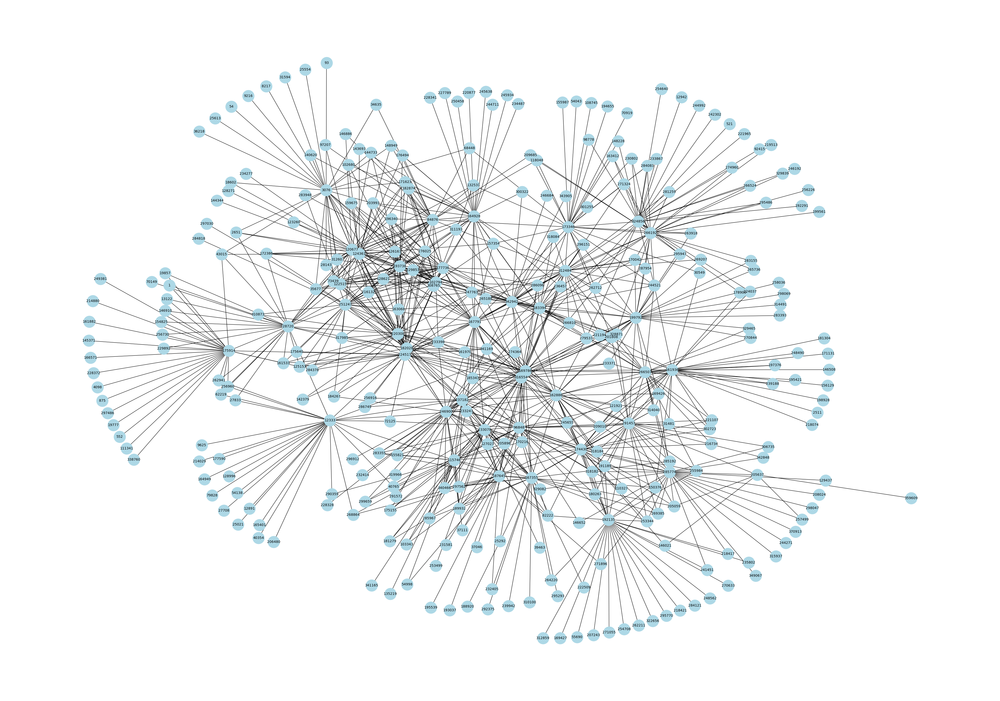

In [29]:
plt.figure(figsize=(40,28))


nx.draw(G, pos = nx.nx_pydot.graphviz_layout(G), \
    node_size=1200, node_color='lightblue', linewidths=0.25, \
    font_size=10, with_labels=True)

plt.show()

In [30]:
# Remove nodes with less degrees
DEGREE_CUTOFF = 5

In [31]:
remove_these_nodes = set()

for node,degree in G.degree() :
    print(f"{node= } {degree=}")

    if degree <= DEGREE_CUTOFF :
        remove_these_nodes.add(node)

node= 266192 degree=29
node= 199792 degree=31
node= 174430 degree=31
node= 255984 degree=5
node= 209010 degree=7
node= 224517 degree=32
node= 102794 degree=31
node= 192135 degree=29
node= 254708 degree=1
node= 324856 degree=28
node= 284083 degree=3
node= 175914 degree=28
node= 229892 degree=2
node= 173346 degree=29
node= 108745 degree=1
node= 167791 degree=32
node= 316554 degree=37
node= 96848 degree=29
node= 318184 degree=6
node= 169427 degree=1
node= 167355 degree=29
node= 264220 degree=2
node= 220308 degree=33
node= 122515 degree=10
node= 312484 degree=30
node= 236457 degree=9
node= 161882 degree=1
node= 3076 degree=28
node= 171623 degree=8
node= 128621 degree=7
node= 157354 degree=8
node= 329839 degree=1
node= 201808 degree=8
node= 164928 degree=32
node= 244711 degree=1
node= 62219 degree=3
node= 9216 degree=1
node= 297562 degree=4
node= 170042 degree=4
node= 183394 degree=31
node= 126163 degree=12
node= 182028 degree=32
node= 216132 degree=9
node= 169786 degree=36
node= 341169 deg

In [32]:
len(remove_these_nodes)

246

In [33]:
# Remove nodes
G.remove_nodes_from(remove_these_nodes)

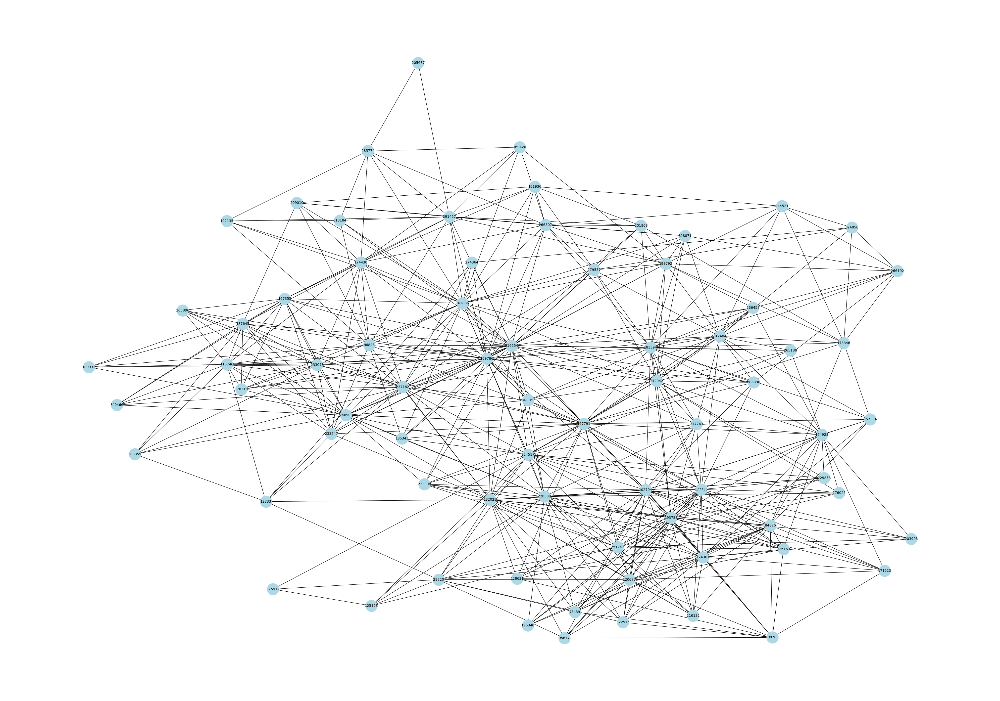

In [34]:
plt.figure(figsize=(40,28))


nx.draw(G, pos = nx.nx_pydot.graphviz_layout(G), \
    node_size=1200, node_color='lightblue', linewidths=0.25, \
    font_size=10, with_labels=True)

plt.show()

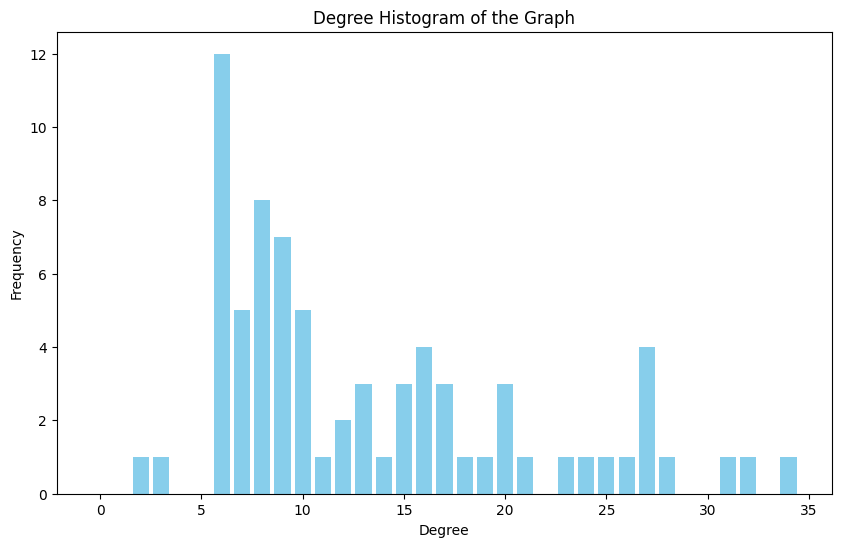

In [35]:
# Get the degree histogram
degree_hist = nx.degree_histogram(G)

# Plot the histogram
plt.figure(figsize=(10, 6))
plt.bar(range(len(degree_hist)), degree_hist, color='skyblue')
plt.xlabel("Degree")
plt.ylabel("Frequency")
plt.title("Degree Histogram of the Graph")
plt.show()

In [36]:

Clustering_coeff=nx.clustering(G)
res = {key : round(Clustering_coeff[key], 3) for key in Clustering_coeff}
df=pd.DataFrame(res.items(), columns=["Node", "Clustering_coeff"])
print(df.sort_values('Clustering_coeff',ascending=False))
# df.to_csv('Clustering_coeff.csv')

      Node  Clustering_coeff
65  205637             1.000
72  205896             1.000
49  340466             1.000
8   175914             1.000
47  170216             0.944
..     ...               ...
25  183394             0.380
10  167791             0.370
32  162886             0.345
29  169786             0.343
11  316554             0.319

[74 rows x 2 columns]


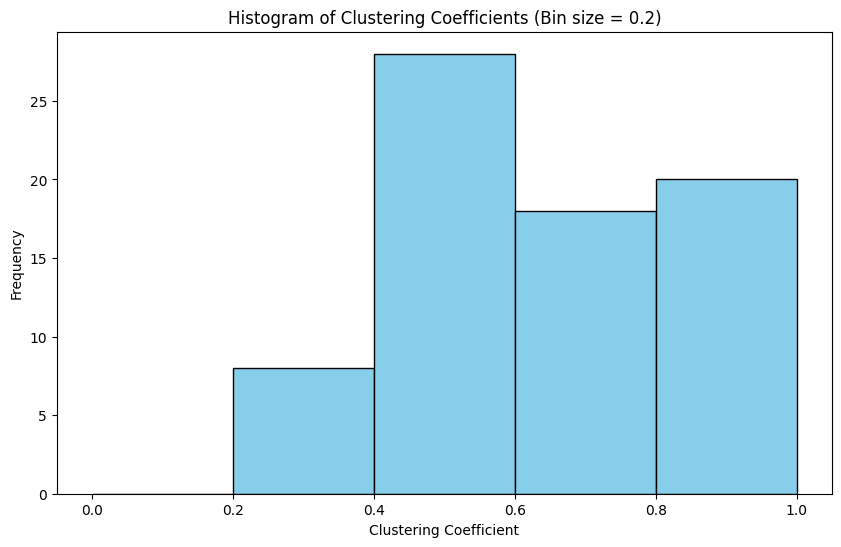

In [37]:
# Convert clustering coefficients to a list for histogram plotting
clustering_values = list(res.values())

# Plot the histogram with bins of 0.2
plt.figure(figsize=(10, 6))
plt.hist(clustering_values, bins=[i * 0.2 for i in range(6)], color='skyblue', edgecolor='black')
plt.xlabel("Clustering Coefficient")
plt.ylabel("Frequency")
plt.title("Histogram of Clustering Coefficients (Bin size = 0.2)")
plt.show()

In [42]:
def set_node_community(G, communities):
    '''Add community to node attributes'''
    for c, v_c in enumerate(communities):
        for v in v_c:
            # Add 1 to save 0 for external edges
            G.nodes[v]['community'] = c + 1
            
def set_edge_community(G):
    '''Find internal edges and add their community to their attributes'''
    for v, w, in G.edges:
        if G.nodes[v]['community'] == G.nodes[w]['community']:
            # Internal edge, mark with community
            G.edges[v, w]['community'] = G.nodes[v]['community']
        else:
            # External edge, mark as 0
            G.edges[v, w]['community'] = 0

def get_color(i, r_off=1, g_off=1, b_off=1):
    r0, g0, b0 = 0, 0, 0
    n = 16
    low, high = 0.1, 0.9
    span = high - low
    r = low + span * (((i + r_off) * 3) % n) / (n - 1)
    g = low + span * (((i + g_off) * 5) % n) / (n - 1)
    b = low + span * (((i + b_off) * 7) % n) / (n - 1)
    return (r, g, b)

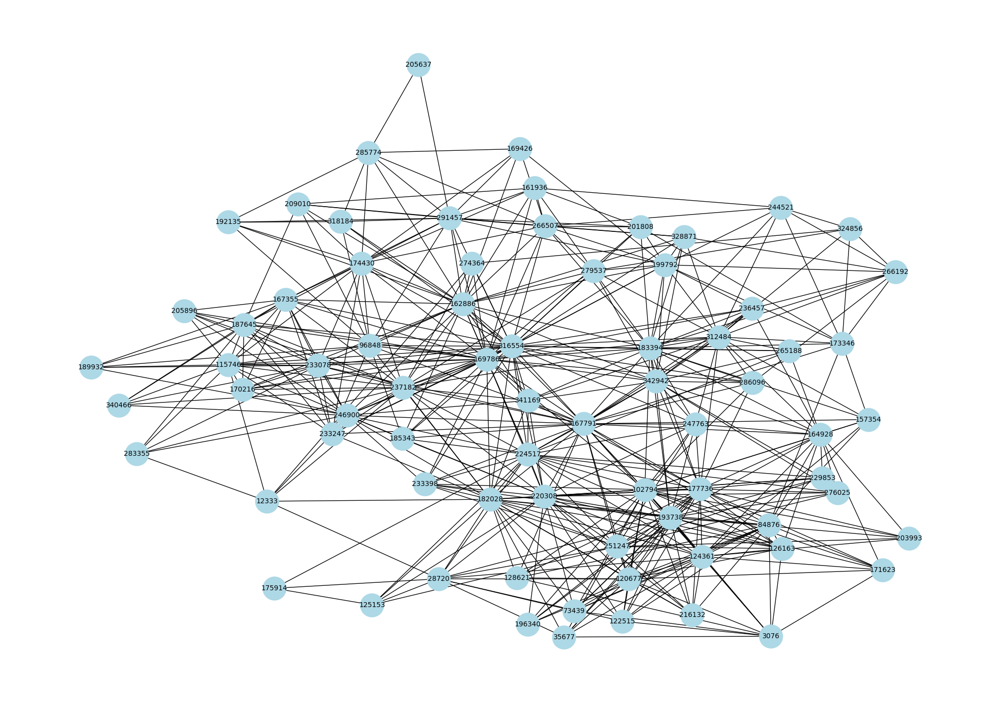

---------- Graph Stats  ----------
Nodes : 74 Edges : 74
Diameter : 4
Periphery : [266192, 209010, 192135, 324856, 175914, 318184, 122515, 3076, 171623, 128621, 157354, 164928, 126163, 216132, 120677, 84876, 177736, 285774, 251247, 340466, 12333, 28720, 276025, 193738, 169426, 125153, 283355, 244521, 124361, 73439, 205637, 203993, 196340, 35677, 229853, 189932]


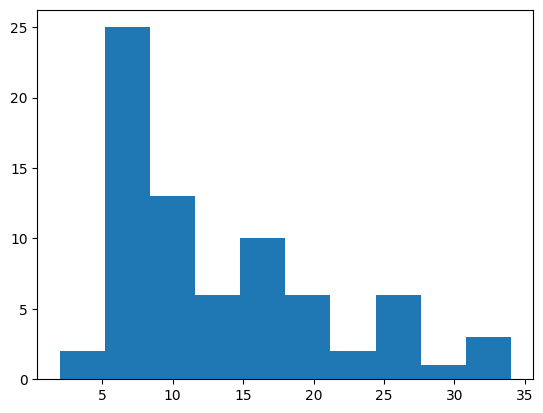

Density of the graph: 0.18252499074416884
Average degree: 13.324324324324325
Size of the largest connected component: 74
Degree assortativity coefficient: -0.12027781835281447
      Node  Degree Centrality
11  316554              0.466
29  169786              0.438
10  167791              0.425
43  177736              0.384
53  193738              0.370
..     ...                ...
54  169426              0.082
49  340466              0.082
73  189932              0.082
8   175914              0.041
65  205637              0.027

[74 rows x 2 columns]
      Node  Closeness Centrality
29  169786                 0.640
11  316554                 0.635
10  167791                 0.629
27  182028                 0.584
25  183394                 0.584
..     ...                   ...
57  283355                 0.388
7   324856                 0.386
8   175914                 0.382
73  189932                 0.382
65  205637                 0.323

[74 rows x 2 columns]
      Node  Betweennes

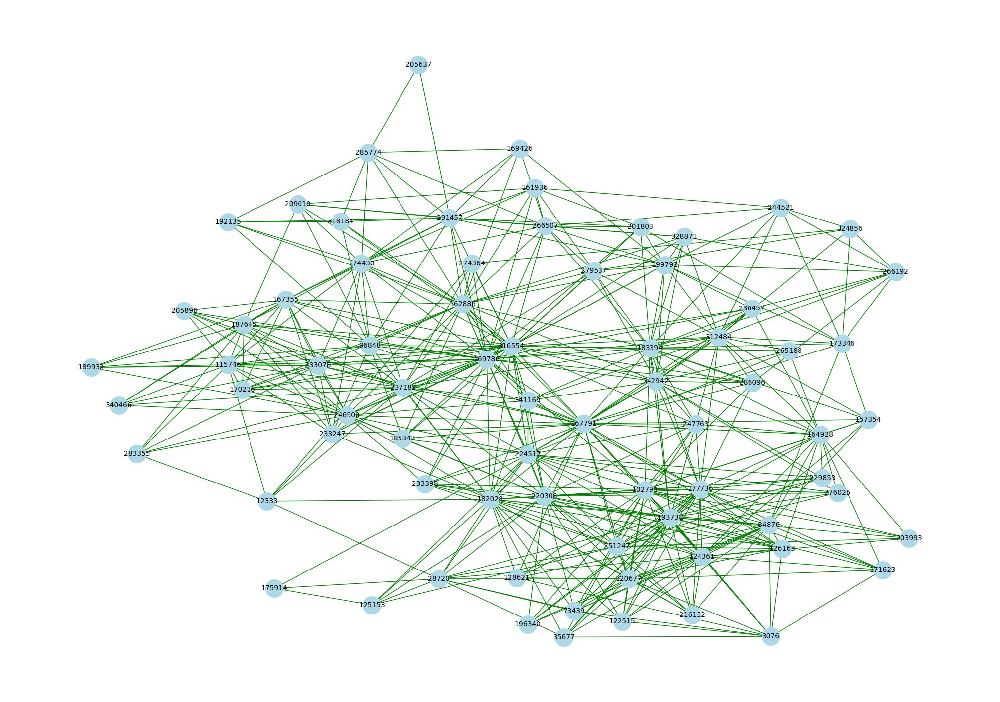

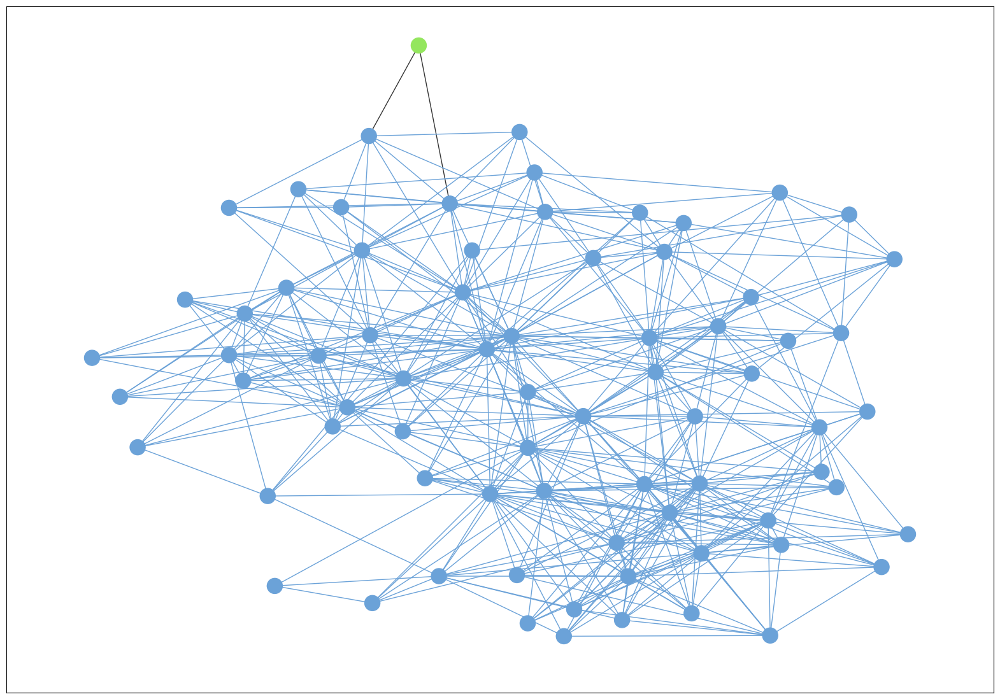

--------------------------------------------------


In [43]:


graph_pos = nx.nx_pydot.graphviz_layout(G)

plt.figure(figsize=(20,14))
nx.draw(G, pos = graph_pos, node_size=1200, node_color='lightblue', linewidths=0.25,font_size=10, with_labels=True)
plt.show()

print("-"*10,"Graph Stats ", "-"*10)

graph = G

num_edges = graph.number_of_edges()
num_nodes = graph.number_of_nodes()

print(f"Nodes : {num_nodes} Edges : {num_nodes}")

print(f"Diameter : {nx.diameter(graph)}") # Diameter

print(f"Periphery : {nx.periphery(graph)}") # Periphery

degrees = [graph.degree(n) for n in graph.nodes()]
plt.hist(degrees)
plt.show()

# Density
density = nx.density(graph)
print(f"Density of the graph: {density}")


# Max and Min degree
degrees = dict(graph.degree())
max_degree = max(degrees.values())
min_degree = min(degrees.values())


# Average degree
avg_degree = (2 * num_edges) / num_nodes
print(f"Average degree: {avg_degree}")

# Number of connected components

connected_components = list(nx.connected_components(graph))
largest_component_size = max(len(c) for c in connected_components) # Find the size of the largest connected component
print(f"Size of the largest connected component: {largest_component_size}")

# Degree assortativity
assortativity = nx.degree_assortativity_coefficient(graph)
print(f"Degree assortativity coefficient: {assortativity}")



# Degree Centrality
deg_centrality=nx.degree_centrality(graph)
res = {key : round(deg_centrality[key], 3) for key in deg_centrality}
df=pd.DataFrame(res.items(), columns=["Node", "Degree Centrality"])
print(df.sort_values('Degree Centrality',ascending=False))

# Closeness Centrality
Closeness_centrality=nx.closeness_centrality(graph)
res = {key : round(Closeness_centrality[key], 3) for key in Closeness_centrality}
df=pd.DataFrame(res.items(), columns=["Node", "Closeness Centrality"])
print(df.sort_values('Closeness Centrality',ascending=False))

# Between Centrality
Betweenness_centrality=nx.betweenness_centrality(graph)
res = {key : round(Betweenness_centrality[key], 3) for key in Betweenness_centrality}
df=pd.DataFrame(res.items(), columns=["Node", "Betweenness Centrality"])
print(df.sort_values('Betweenness Centrality',ascending=False))

# Katz Centrality
Katz_centrality=nx.katz_centrality(graph,alpha=0.05, beta=1.0, max_iter=1000, tol=1e-02, nstart=None, normalized=True, weight=None)
res = {key : round(Katz_centrality[key], 3) for key in Katz_centrality}
df=pd.DataFrame(res.items(), columns=["Node", "Katz Centrality"])
print(df.sort_values('Katz Centrality',ascending=False))

# Bridges


plt.figure(figsize=(20,14))

graph_bridges = list(nx.bridges(graph))


# Draw all edges with default color
nx.draw(graph, graph_pos, with_labels=True, edge_color='green', node_color='lightblue', node_size=700 ,linewidths=0.25,font_size=10)



bridge_edges = [(u, v) for u, v in graph_bridges]

# Draw bridges with a different color (red)
nx.draw_networkx_edges(graph, graph_pos, edgelist=bridge_edges, edge_color='red', width=3)

plt.show()


# Community Detection
result = nxcom.girvan_newman(graph)

communities = sorted(nxcom.greedy_modularity_communities(G), key=len, reverse=True)

communities = next(result)
set_node_community(graph, communities)
set_edge_community(graph)

# Set community color for nodes
node_color = [get_color(graph.nodes[v]['community']) for v in graph.nodes]

# Set community color for internal edges
external = [(v, w) for v, w in graph.edges if graph.edges[v, w]['community'] == 0]
internal = [(v, w) for v, w in graph.edges if graph.edges[v, w]['community'] > 0]
internal_color = [get_color(graph.edges[e]['community']) for e in internal]

plt.figure(figsize=(20,14))

nx.draw_networkx(
    graph, pos=graph_pos, node_size=0,
    edgelist=external, edge_color="#333333", with_labels=False)

nx.draw_networkx(
    graph, pos=graph_pos, node_color=node_color,
    edgelist=internal, edge_color=internal_color , with_labels= False)

plt.show()
print("-"*50)

In [44]:


# Step 1: Create a sample graph
G = nx.erdos_renyi_graph(100, 0.1)  # For example, a random Erdős-Rényi graph

# Step 2: Initialize Node2Vec with the graph and parameters
# The parameters `p` and `q` control the likelihood of returning to a previous node or exploring further.
node2vec = Node2Vec(G, dimensions=64, walk_length=30, num_walks=200, p=1, q=1, workers=4)

# Step 3: Fit the model and generate embeddings
model = node2vec.fit(window=10, min_count=1, batch_words=4)

# Step 4: Get embeddings for each node and store them in a dictionary
node_embeddings = {str(node): model.wv[str(node)] for node in G.nodes()}

# Display embeddings for a few nodes
for node, embedding in list(node_embeddings.items())[:5]:
    print(f"Node {node}: Embedding - {embedding}")

Generating walks (CPU: 4): 100%|██████████| 50/50 [00:00<00:00, 169.83it/s]


Node 0: Embedding - [ 0.1216988  -0.48174334  0.12995395 -0.19750553 -0.16376597 -0.4414598
  0.02534995 -0.05503951 -0.49705726 -0.29300332  0.12936893 -0.17707054
  0.22468369 -0.18394294  0.6243081  -0.07993777 -0.15318002  0.13854788
 -0.23986566  0.10806128 -0.01131445  0.12239788 -0.02604435 -0.08559748
 -0.05427302 -0.10691244 -0.08565823  0.31599814  0.20871374  0.08334905
 -0.01084825 -0.06653752 -0.19039366 -0.29088497  0.1928869  -0.05297344
 -0.0872314  -0.07943536 -0.02040383  0.1975463   0.11080548 -0.18731165
  0.08785582 -0.088281    0.17879848  0.1282852   0.30056927  0.07395697
 -0.21444134  0.27138618  0.00915098 -0.11281945  0.08957989  0.01587221
 -0.29692155  0.26111647  0.15330966 -0.14626709 -0.0327172   0.02819227
  0.09772895 -0.27702397  0.15439637  0.03098966]
Node 1: Embedding - [-0.31119537  0.2376254   0.00412835 -0.04705114  0.03588558  0.02552205
  0.00438214  0.01209523 -0.14121817  0.37648797 -0.12295548  0.07348498
 -0.3921053  -0.1565938   0.0463872

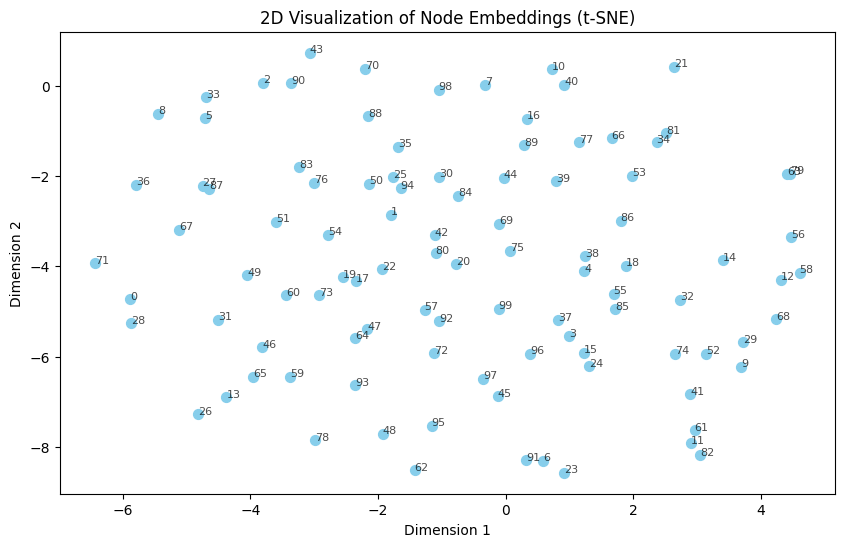

In [46]:
from sklearn.manifold import TSNE
import numpy as np
import matplotlib.pyplot as plt

# Convert the embeddings dictionary to a 2D numpy array
embeddings = np.array(list(node_embeddings.values()))
node_labels = list(node_embeddings.keys())

# Reduce dimensions to 2D using t-SNE
tsne = TSNE(n_components=2, random_state=42, perplexity=30, n_iter=1000)
embeddings_2d = tsne.fit_transform(embeddings)

# Plot the 2D embeddings
plt.figure(figsize=(10, 6))
plt.scatter(embeddings_2d[:, 0], embeddings_2d[:, 1], s=50, color='skyblue')

# Optionally add node labels for clarity (remove if there are too many nodes)
for i, label in enumerate(node_labels):
    plt.annotate(label, (embeddings_2d[i, 0], embeddings_2d[i, 1]), fontsize=8, alpha=0.7)

plt.title("2D Visualization of Node Embeddings (t-SNE)")
plt.xlabel("Dimension 1")
plt.ylabel("Dimension 2")
plt.show()